In [1]:
# Support for maths
import numpy as np
# Plotting tools
from matplotlib import pyplot as plt
# we use the following for plotting figures in jupyter
%matplotlib inline
# Importing data library
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

# GPy: Gaussian processess libary
import GPy
from IPython.display import display

plt.rcParams.update({'font.size': 32})

In [2]:
# Pembacaan File Data Polusi Udara ISPU Excel
DKI3 = pd.read_excel("./Data/Normalization/DATA ISPU - Normalization.xlsx", sheet_name="DKI3")

In [3]:
# Menampilkan 5 Data pertama DKI1
DKI3.head()

,Tanggal,Wilayah,PM10,SO2,CO,O3,NO2,Max,Critical,Kategori
0,2017-01-01,DKI3 (Jagakarsa),0.612069,0.263636,0.152542,0.148718,0.037736,0.366834,PM10,Sedang
1,2017-01-02,DKI3 (Jagakarsa),0.318966,0.245455,0.025424,0.148718,0.018868,0.195980,PM10,Baik
2,2017-01-03,DKI3 (Jagakarsa),0.422414,0.254545,0.050847,0.164103,0.018868,0.256281,PM10,Sedang
3,2017-01-04,DKI3 (Jagakarsa),0.370690,0.281818,0.050847,0.302564,0.056604,0.316583,O3,Sedang
4,2017-01-05,DKI3 (Jagakarsa),0.448276,0.254545,0.127119,0.328205,0.075472,0.341709,O3,Sedang


Train Test Data

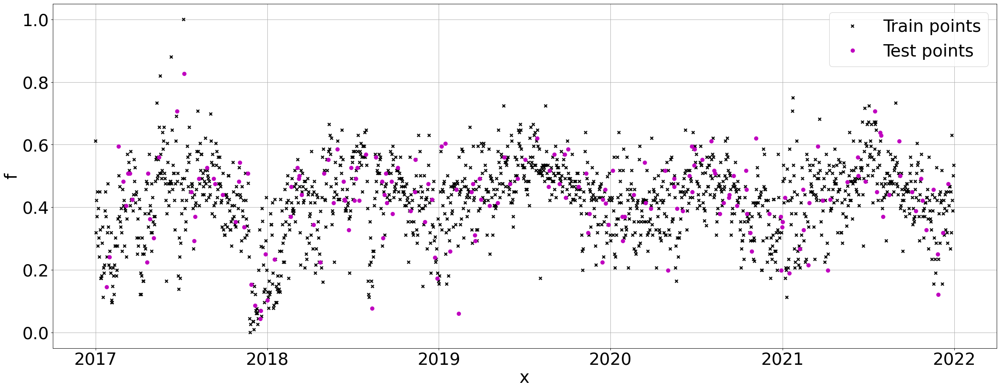

In [4]:
# X = np.array(DKI1.Tanggal.astype('int64') // 10**9)
X = np.array(DKI3.index).reshape(-1,1)
# X = np.array(DKI1['Tanggal']).reshape(-1,1)
Y = np.array(DKI3['PM10']).reshape(-1,1)

from sklearn.model_selection import train_test_split

train_X, test_X, train_Y, test_Y = train_test_split(X, Y, test_size=0.1, random_state=42, shuffle=True)

# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(np.array(DKI3['Tanggal'].loc[train_X.flatten()]).reshape(-1,1), train_Y, "kx", mew=2, label='Train points')
plt.plot(np.array(DKI3['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), test_Y, "mo", mew=2, label='Test points')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.grid()
plt.legend()

#### Kernel
Optimizing kernel parameters

In [307]:
k1 = GPy.kern.RBF(1)
# k1.variance = 0.175
# k1.lengthscale = 22.44
m1 = GPy.models.GPRegression(train_X, train_Y, k1)
# m1.Gaussian_noise = 0.0055
# m1.Gaussian_noise = 0
# m1.Gaussian_noise.fix()

# Make a gamma prior and set it as the prior for the lengthscale
# gamma_prior = GPy.priors.Gamma.from_EV(1.5, 0.7)
# gamma_prior.plot()
# m1.rbf.lengthscale.set_prior(gamma_prior)

m1.optimize(messages=1, ipython_notebook=True)

In [308]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m1.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [5]:
from sklearn import metrics

def print_evaluate(true, predicted):  
    mae = metrics.mean_absolute_error(true, predicted)
    mse = metrics.mean_squared_error(true, predicted)
    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)
    mape = metrics.mean_absolute_percentage_error(true,predicted)
    print('MAE:', mae)
    print('MSE:', mse)
    print('RMSE:', rmse)
    print('MAPE:', mape)

    print('R2 Square', r2_square)
    print('__________________________________')

In [310]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y.flatten(), m1.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.08471793654531543
MSE: 0.011827620628715459
RMSE: 0.10875486485079855
MAPE: 593945351446.9983
R2 Square 0.22521314965342998
__________________________________


In [311]:
metrics.r2_score(train_Y.flatten(), m1.predict(train_X)[0].flatten())

0.3792407716588201

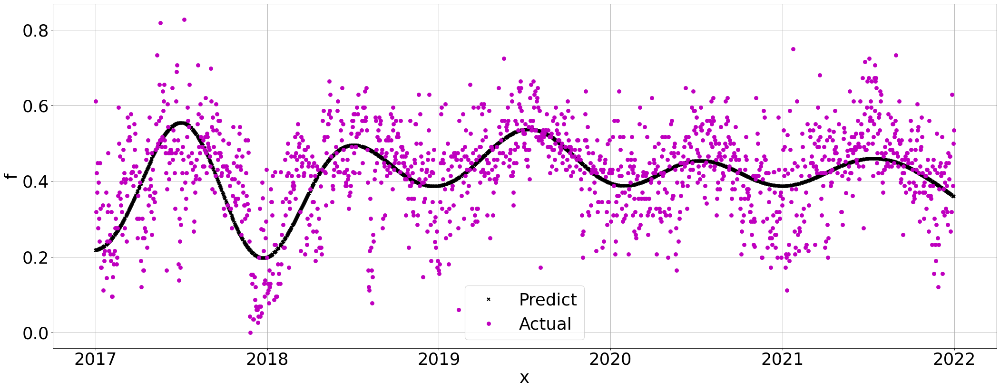

In [312]:
# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(np.array(DKI3['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), m1.predict(test_X)[0], 'kx', mew=2, label='Predict')
plt.plot(np.array(DKI3['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), test_Y, 'mo', mew=2, label='Actual')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.grid()
plt.legend()

Periodic

In [313]:
k2 = GPy.kern.StdPeriodic(1, period=2)
m2 = GPy.models.GPRegression(train_X, train_Y, k2)
m2.optimize(messages=1, ipython_notebook=True)

In [314]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m2.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [315]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m2.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.09779673593674908
MSE: 0.015615084796654915
RMSE: 0.12496033289270206
MAPE: 1109106665020.0723
R2 Square -0.022890634327761505
__________________________________


In [316]:
metrics.r2_score(train_Y.flatten(), m2.predict(train_X)[0].flatten())

0.021022820280778953

White

In [317]:
k3 = GPy.kern.White(1)
m3 = GPy.models.GPRegression(train_X, train_Y, k3)
m3.optimize(messages=1, ipython_notebook=True)

In [318]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m3.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [319]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m3.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.42384212834996204
MSE: 0.19490779427461571
RMSE: 0.44148362854653594
MAPE: 0.9993917274939172
R2 Square -11.767740932389666
__________________________________


In [320]:
metrics.r2_score(train_Y.flatten(), m3.predict(train_X)[0].flatten())

-8.742840206735112

Linear

In [321]:
k4 = GPy.kern.Linear(1)
m4 = GPy.models.GPRegression(train_X, train_Y, k4)
m4.optimize(messages=1, ipython_notebook=True)

In [322]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m4.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [323]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m4.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.19116240264401052
MSE: 0.05418937879128134
RMSE: 0.23278612241987567
MAPE: 328749599266.2779
R2 Square -2.5497602970119875
__________________________________


In [324]:
metrics.r2_score(train_Y.flatten(), m4.predict(train_X)[0].flatten())

-1.8096906768925112

Exponential

In [6]:
k5 = GPy.kern.Exponential(1)
m5 = GPy.models.GPRegression(train_X, train_Y, k5)
m5.optimize(messages=1, ipython_notebook=True)

In [326]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m5.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [7]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m5.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.07032912929838846
MSE: 0.008705745255526975
RMSE: 0.09330458325037938
MAPE: 0.27489763007816115
R2 Square 0.5035508201329493
__________________________________


In [328]:
metrics.r2_score(train_Y.flatten(), m5.predict(train_X)[0].flatten())

0.9999999999990035

Matern32

In [329]:
k6 = GPy.kern.Matern32(1)
m6 = GPy.models.GPRegression(train_X, train_Y, k6)
m6.optimize(messages=1, ipython_notebook=True)

In [330]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m6.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [331]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m6.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.08401220791952134
MSE: 0.01164882397726184
RMSE: 0.10792971776698872
MAPE: 551418994798.0853
R2 Square 0.23692550489214437
__________________________________


In [332]:
metrics.r2_score(train_Y.flatten(), m6.predict(train_X)[0].flatten())

0.4175262699940091

Matern52

In [333]:
k7 = GPy.kern.Matern52(1)
m7 = GPy.models.GPRegression(train_X, train_Y, k7)
m7.optimize(messages=1, ipython_notebook=True)

In [334]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m7.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [335]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m7.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.08437121832686538
MSE: 0.011729937754364907
RMSE: 0.10830483716974466
MAPE: 563179411104.1793
R2 Square 0.23161201963131184
__________________________________


In [336]:
metrics.r2_score(train_Y.flatten(), m7.predict(train_X)[0].flatten())

0.3981504533060334

Brownian

In [337]:
k8 = GPy.kern.Brownian(1)
m8 = GPy.models.GPRegression(train_X, train_Y, k8)
m8.optimize(messages=1, ipython_notebook=True)

In [338]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m8.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [339]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m8.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.0830686570862541
MSE: 0.012034862639009259
RMSE: 0.10970352154333633
MAPE: 424611849768.194
R2 Square 0.21163743654464184
__________________________________


In [340]:
metrics.r2_score(train_Y.flatten(), m8.predict(train_X)[0].flatten())

0.6196122204993741

Bias

In [341]:
k9 = GPy.kern.Bias(1)
m9 = GPy.models.GPRegression(train_X, train_Y, k9)
m9.optimize(messages=1, ipython_notebook=True)

In [342]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m9.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [343]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m9.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.09676175512783713
MSE: 0.015355501072329596
RMSE: 0.12391731546611875
MAPE: 1135112173927.8813
R2 Square -0.0058861951015865
__________________________________


In [344]:
metrics.r2_score(train_Y.flatten(), m9.predict(train_X)[0].flatten())

-3.4913230184674404e-06

Periodik Eksponensial

In [345]:
k10 = GPy.kern.PeriodicExponential(1)
m10 = GPy.models.GPRegression(train_X, train_Y, k10)
m10.optimize(messages=1, ipython_notebook=True)

In [346]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m10.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [347]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m10.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.4240659225404587
MSE: 0.19517312763453182
RMSE: 0.44178402827007207
MAPE: 31347693915.725437
R2 Square -11.785122010518107
__________________________________


In [348]:
metrics.r2_score(train_Y.flatten(), m10.predict(train_X)[0].flatten())

-8.668586125215699